## Lending Club Case Study

### Data understanding

#### Problem Statement:

A finance service company called the Lending Club offers customers to lend various types of loans. Some of the types of loans are business loans, personal loans, educational loans, home loans etc. 

When an applicant applies for a loan, the company has to take a decision for a loan approval based on the applicant’s information. 

When a person applies for a loan, there are two types of decisions that could be taken by the company:

Loan accepted: If the company approves the loan, there are 3 possible scenarios described below:

    Fully paid: Applicant has fully paid the loan (the principal and the interest rate)

    Current: Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.

    Charged-off: Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan 

Loan rejected: The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)

#### Business Objective:

Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). The credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'. 

If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.

In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment.

#### Assumption

The dataset consists of data dictionary and loans details issued from 2007 to 2011 by the Lending Club. 

Since the company wants to understand the driving factor behind a defaults, only those variables will be considered for the analysis. These variables will be helpful in helping the investor to take a decision on whether or not to invest in the loan request. Customer behaviour information provided in the dataset will not be considered

Importing the required libraries for the analysis.

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

In [77]:
lc_df = pd.read_csv('loan.csv')

In [78]:
lc_df.shape

(39717, 111)

In [79]:
lc_df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


### Data Cleaning and Manipulation

Let's clean the dataset provided by first removing columns with the most missing values or NA. The threshold we would consider would be 80%

In [80]:
lc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [81]:
# calculating the percentage of the missing value and checking for those specific columns
null_columns = round(lc_df.isnull().sum()/lc_df.shape[0] * 100)
missing_val_col = null_columns[null_columns > 80]
missing_val_col

mths_since_last_record             93.0
next_pymnt_d                       97.0
mths_since_last_major_derog       100.0
annual_inc_joint                  100.0
dti_joint                         100.0
verification_status_joint         100.0
tot_coll_amt                      100.0
tot_cur_bal                       100.0
open_acc_6m                       100.0
open_il_6m                        100.0
open_il_12m                       100.0
open_il_24m                       100.0
mths_since_rcnt_il                100.0
total_bal_il                      100.0
il_util                           100.0
open_rv_12m                       100.0
open_rv_24m                       100.0
max_bal_bc                        100.0
all_util                          100.0
total_rev_hi_lim                  100.0
inq_fi                            100.0
total_cu_tl                       100.0
inq_last_12m                      100.0
acc_open_past_24mths              100.0
avg_cur_bal                       100.0


In [82]:
missing_val_col = list(missing_val_col.index)
missing_val_col

['mths_since_last_record',
 'next_pymnt_d',
 'mths_since_last_major_derog',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_il_6m',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_recent_revol_delinq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'pct_tl_nvr_dlq',
 'percen

In [83]:
# Dropping the columns mentioned in missing_val_col
lc_df.drop(missing_val_col, axis = 1,inplace = True)
lc_df

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,80.90,Jun-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,281.94,Jul-10,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,0.00,Jun-07,NaN,1,INDIVIDUAL,0,NaN,0,NaN,NaN


In [84]:
lc_df.shape

(39717, 55)

#### Conclusion: Custom behaviour variables should be dropped as well, since they don't add any value to our investigation.

["delinq_2yrs",
"earliest_cr_line",
"inq_last_6mths",
"open_acc", 
"pub_rec",
"revol_bal",
"revol_util",
"total_acc",
"out_prncp",
"out_prncp_inv",
"total_pymnt",
"total_pymnt_inv",
"total_rec_prncp",
"total_rec_int",
"total_rec_late_fee",
"recoveries",
"collection_recovery_fee",
"last_pymnt_d",
"last_pymnt_amnt",
"last_credit_pull_d",
"application_type"]

# TODO

"delinq_2yrs", "earliest_cr_line", "inq_last_6mths", "open_acc", "pub_rec", "revol_bal", "revol_util", "total_acc", "out_prncp", "out_prncp_inv", "total_pymnt", "total_pymnt_inv", "total_rec_prncp", "total_rec_int", "total_rec_late_fee", "recoveries", "collection_recovery_fee", "last_pymnt_d", "last_pymnt_amnt", "last_credit_pull_d", "application_type"

In [85]:
# Dropping the columns considered as customer behaviour variables
lc_df_columns = ["delinq_2yrs",
"earliest_cr_line",
"inq_last_6mths",
"open_acc", 
"pub_rec",
"revol_bal",
"revol_util",
"total_acc",
"out_prncp",
"out_prncp_inv",
"total_pymnt",
"total_pymnt_inv",
"total_rec_prncp",
"total_rec_int",
"total_rec_late_fee",
"recoveries",
"collection_recovery_fee",
"last_pymnt_d",
"last_pymnt_amnt",
"last_credit_pull_d",
"application_type",
"url",
"zip_code",
"addr_state",
"desc",
"title"]
lc_df.drop(lc_df_columns, axis = 1, inplace = True)
lc_df.shape

(39717, 29)

1. url : URL for LC page with each memberid, hence it does not contribute for analysis.
2. addr_state : addr_state,zip_code does not contribute to analysis since its member portfolio information.
3. desc : Loan description provided by the borrower, therefore it won't be helpful in the analysis.
4. title : is a loan title provided by the borrower, therefore it won't be helpful in the analysis.
5. member_id : id provided to the loan, hence it does not contribute for analysis.
6. id: unique id provided to the member, hence it does not contribute for analysis
7. initial_list_status: is a initial listing status of the loan.The only value found in the dataset is F.Therefore it won't be helpful in the analysis.
8. collections_12_mths_ex_med: is number of collections made in 12 months excluding medical collections. The only value found in the dataset is 0.Therefore it won't be helpful in the analysis.
9. policy_code: is a column of the policy code for the loan. The value in the dataset is 1, which means all are publicly available, hence nothing to contribute for analysis
10. acc_now_delinq: is a no of account in which borrowers are delinquent. The values present in the entire dataset is 0, hence it won't contribute for analysis.
11. chargeoff_within_12_mths: no. of charge off within 12 months. The values present in the entire dataset is 0, hence it won't contribute for analysis.
12. delinq_amnt: is a past due amount owed to the lender. The values present in the entire dataset is 0, hence it won't contribute for analysis.
13. tax_liens: is a no. of tax liens. The values present in the entire dataset is 0, hence it won't contribute for analysis.
14. mths_since_last_delinq: DOUBT in this!!!!!!!!!
15. pub_rec_bankruptcies: is a no. of bankcruptcies declared by the borrowers. Since the customer can file bankruptcy insurance against it it won't affect the financial stature of the borrower. Hence it won't contribute for analysis.

In [86]:
lc_df_columns = ["id",
"member_id",
"initial_list_status",
"collections_12_mths_ex_med", 
"policy_code",
"acc_now_delinq",
"chargeoff_within_12_mths",
"delinq_amnt",
"tax_liens",
"mths_since_last_delinq",
"pub_rec_bankruptcies"
]
lc_df.drop(lc_df_columns, axis = 1, inplace = True)
lc_df.shape

(39717, 18)

##### Since the applicant is in the process of paying the installments and the tenure of the loan has not yet been completed. These candidates are not labelled as 'defaulted'. Hence wont be consired for the analysis.

In [87]:
lc_df = lc_df[lc_df["loan_status"] != "Current"]

In [88]:
lc_df.shape

(38577, 18)

In [89]:
lc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38577 entries, 0 to 39716
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   loan_amnt            38577 non-null  int64  
 1   funded_amnt          38577 non-null  int64  
 2   funded_amnt_inv      38577 non-null  float64
 3   term                 38577 non-null  object 
 4   int_rate             38577 non-null  object 
 5   installment          38577 non-null  float64
 6   grade                38577 non-null  object 
 7   sub_grade            38577 non-null  object 
 8   emp_title            36191 non-null  object 
 9   emp_length           37544 non-null  object 
 10  home_ownership       38577 non-null  object 
 11  annual_inc           38577 non-null  float64
 12  verification_status  38577 non-null  object 
 13  issue_d              38577 non-null  object 
 14  loan_status          38577 non-null  object 
 15  pymnt_plan           38577 non-null 

 #### Variables considered in the data analysis
 
 1.   loan_amnt            is the loan amount requested by the borrower.  
 2.   funded_amnt          is the total amount committed to the loan at that point in time.
 3.   funded_amnt_inv      is total amount committed by investors for that loan at that point in time.
 4.   term                 The number of payments on the loan. Values are in months and can be either 36 or 60.
 5.   int_rate             Interest Rate on the loan
 6.   installment          The monthly payment owed by the borrower if the loan originates.
 7.   grade                LC assigned loan grade
 8.   sub_grade            LC assigned loan subgrade
 9.   emp_title            The job title supplied by the Borrower when applying for the loan.
 10.  emp_length           Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.
 11.  home_ownership        The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.
 12.  annual_inc            The self-reported annual income provided by the borrower during registration.
 13.  verification_status   Indicates if income was verified by LC, not verified, or if the income source was verified 
 14.  issue_d               The month which the loan was funded
 15.  loan_status           Current status of the loan. Possible values are Fully Paid, Charged Off and Current
 16.  pymnt_plan            Indicates if a payment plan has been put in place for the loan
 17.  purpose               A category provided by the borrower for the loan request.
 18.  dti                   A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.

In [90]:
lc_df["emp_length"].unique()

array(['10+ years', '< 1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '1 year', '6 years', '2 years', '7 years',
       nan], dtype=object)

In [91]:
# Since emp_length have nan values removing those rows
lc_df = lc_df[~lc_df.emp_length.isnull()]

In [92]:
lc_df.shape

(37544, 18)

In [93]:
lc_df['issue_d'].unique()

array(['Dec-11', 'Nov-11', 'Oct-11', 'Sep-11', 'Aug-11', 'Jul-11',
       'Jun-11', 'May-11', 'Apr-11', 'Mar-11', 'Feb-11', 'Jan-11',
       'Dec-10', 'Nov-10', 'Oct-10', 'Sep-10', 'Aug-10', 'Jul-10',
       'Jun-10', 'May-10', 'Apr-10', 'Mar-10', 'Feb-10', 'Jan-10',
       'Dec-09', 'Nov-09', 'Oct-09', 'Sep-09', 'Aug-09', 'Jul-09',
       'Jun-09', 'May-09', 'Apr-09', 'Mar-09', 'Feb-09', 'Jan-09',
       'Dec-08', 'Nov-08', 'Oct-08', 'Sep-08', 'Aug-08', 'Jul-08',
       'Jun-08', 'May-08', 'Apr-08', 'Mar-08', 'Feb-08', 'Jan-08',
       'Dec-07', 'Nov-07', 'Oct-07', 'Sep-07', 'Aug-07', 'Jul-07',
       'Jun-07'], dtype=object)

#### Added two columns derived from issue date of the loan into issue_d_month and issue_d_year

In [142]:
lc_df["issue_d"] = pd.to_datetime(lc_df["issue_d"], format='%b-%y')
lc_df['issue_d_month'] = pd.to_datetime(lc_df['issue_d']).dt.month
lc_df['issue_d_year'] = pd.to_datetime(lc_df['issue_d']).dt.year

In [143]:
# Checking for null values in the final dataset considered for the analysis
lc_df.isnull().sum()

loan_amnt                 0
funded_amnt               0
funded_amnt_inv           0
term                      0
int_rate                  0
installment               0
grade                     0
sub_grade                 0
emp_title              1408
emp_length                0
home_ownership            0
annual_inc                0
verification_status       0
issue_d                   0
loan_status               0
pymnt_plan                0
purpose                   0
dti                       0
Borr_Agency               0
agency_Inves              0
issue_d_month             0
issue_d_year              0
dtype: int64

In [144]:
lc_df["term"].unique()

array(['36', '60'], dtype=object)

In [145]:
# Picking only the numeric value which is 36 and 60 in order to plot a better graph
lc_df['term'] = lc_df.term.apply(lambda x: x.split()[0])
lc_df['term']

0        36
1        60
2        36
3        36
5        36
         ..
39712    36
39713    36
39714    36
39715    36
39716    36
Name: term, Length: 37544, dtype: object

In [146]:
lc_df["grade"].unique()

array(['B', 'C', 'A', 'E', 'F', 'D', 'G'], dtype=object)

In [147]:
lc_df["sub_grade"].unique()

array(['B2', 'C4', 'C5', 'C1', 'A4', 'E1', 'F2', 'B5', 'C3', 'B1', 'D1',
       'A1', 'B3', 'B4', 'C2', 'D2', 'A3', 'A5', 'D5', 'A2', 'E4', 'D3',
       'D4', 'F3', 'E3', 'F1', 'E5', 'G4', 'E2', 'G2', 'G1', 'F5', 'F4',
       'G5', 'G3'], dtype=object)

In [148]:
lc_df["emp_length"].unique()

array(['10+ years', '< 1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '1 year', '6 years', '2 years', '7 years'],
      dtype=object)

In [149]:
lc_df["home_ownership"].unique()

array(['RENT', 'OWN', 'MORTGAGE', 'OTHER', 'NONE'], dtype=object)

In [150]:
lc_df["verification_status"].unique()

array(['Verified', 'Source Verified', 'Not Verified'], dtype=object)

In [151]:
lc_df["purpose"].unique()

array(['credit_card', 'car', 'small_business', 'other', 'wedding',
       'debt_consolidation', 'home_improvement', 'major_purchase',
       'medical', 'moving', 'vacation', 'house', 'renewable_energy',
       'educational'], dtype=object)

## Data Analysis

List of categorical variables which can be investigated based on their unique unordered values

1. loan_status
2. term
3. grade
4. sub_grade
5. emp_title
6. emp_length
7. home_ownership
8. verification_status
9. purpose

In [152]:
# Create two different dataset categorised by loan_status e.i Fully Paid and Charged Off
lc_fully_paid = lc_df[lc_df['loan_status'] == "Fully Paid"]
lc_charged_off = lc_df[lc_df['loan_status'] == "Charged Off"]

## Univariant analysis

   ### Loan Status


<Axes: ylabel='loan_status'>

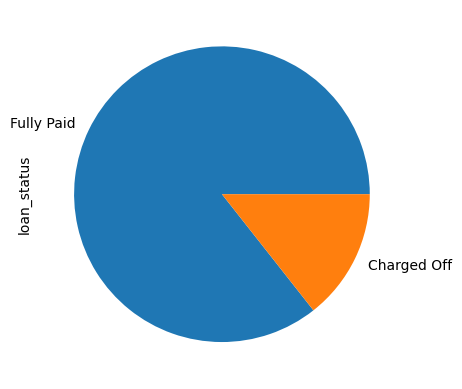

In [233]:
lc_df['loan_status'].value_counts().plot.pie()


Insight : Maximum loans are fully paid

### Ordered Categorical Variables

### Term

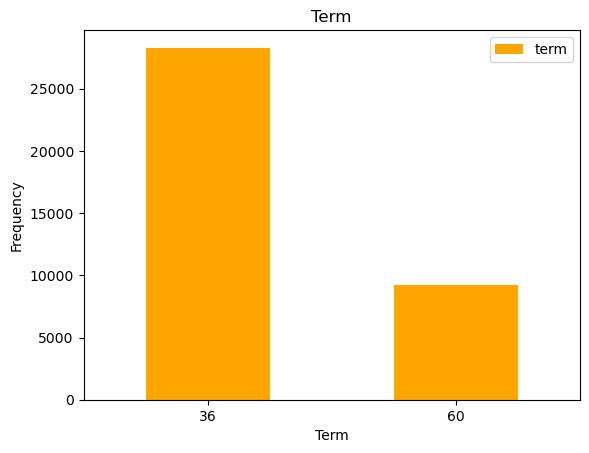

In [154]:
lc_df.term.value_counts().plot(kind='bar' , color = 'Orange')
plt.xlabel('Term')
plt.ylabel('Frequency')
plt.title('Term')
plt.xticks(rotation=0)
plt.legend(loc='upper right')
plt.show()

#sns.set_style("Set2")
#sns.barplot(x = 'index' , y = lc_df.term.value_counts() , data = lc_df)

Insight: Borrowers have taken 36 months tenure loan more than 60 months.

# Grade

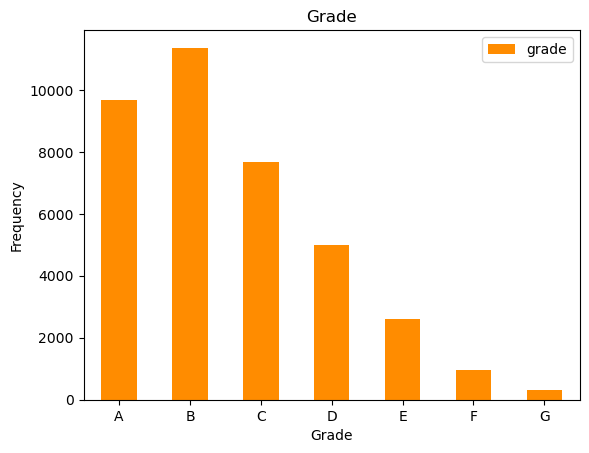

In [155]:
lc_df.grade.value_counts().sort_index().plot(kind='bar' , color = 'DarkOrange')
plt.xlabel('Grade')
plt.ylabel('Frequency')
plt.title('Grade')
plt.xticks(rotation=0)
plt.legend(loc='upper right')
plt.show()

Insight: Most Borrowers comes under A and B grade.

# Sub Grade



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


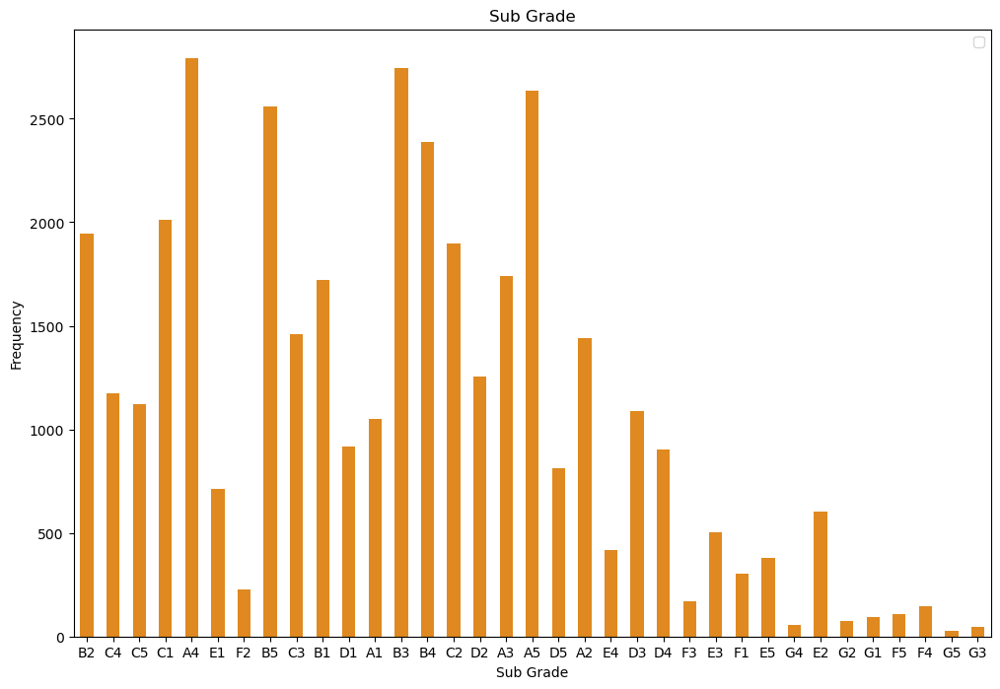

In [156]:
fig, ax = plt.subplots( figsize=(12,8))
sns.countplot(x = 'sub_grade' , data = lc_df, width= 0.5, color= 'Darkorange')
plt.xlabel('Sub Grade')
plt.ylabel('Frequency')
plt.title('Sub Grade')
plt.xticks(rotation=0)
plt.legend(loc='upper right')
plt.show()
#order= lc_df['sub_grade'].sort_index())
#plt.subplots_adjust(hspace= 15, wspace=15)


## Employee Length

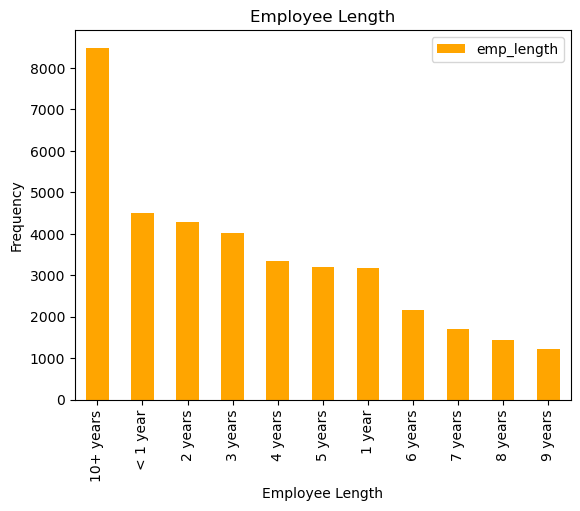

In [158]:
lc_df.emp_length.value_counts().plot(kind='bar', color = 'Orange')
plt.xlabel('Employee Length')
plt.ylabel('Frequency')
plt.title('Employee Length')
plt.xticks(rotation=90)
plt.legend(loc='upper right')
plt.show()

Observation : Most Borrowers are mostly 10+ years employeement Length

### Unordered Categorical Variables

##  Home Ownership

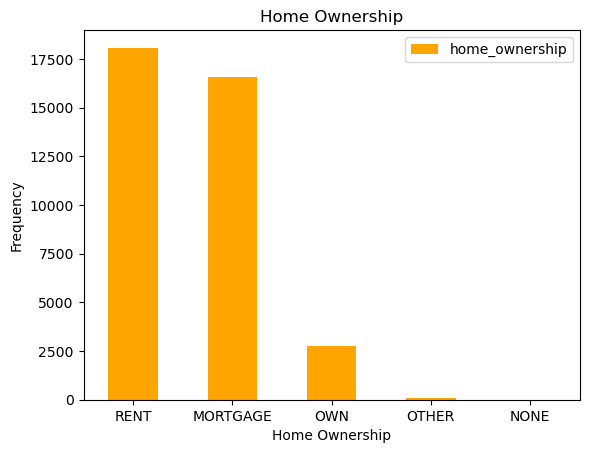

In [159]:
lc_df.home_ownership.value_counts().plot(kind='bar', color = 'Orange')
plt.xlabel('Home Ownership')
plt.ylabel('Frequency')
plt.title('Home Ownership')
plt.xticks(rotation=0)
plt.legend(loc='upper right')
plt.show()

Observation : Maximum loan taken are renter

## Verification Status

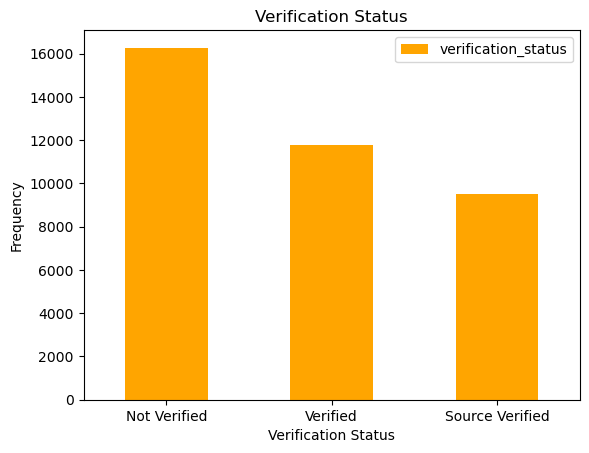

In [161]:
lc_df.verification_status.value_counts().plot(kind = 'bar', color = 'orange')
plt.xlabel('Verification Status')
plt.ylabel('Frequency')
plt.title('Verification Status')
plt.xticks(rotation=0)
plt.legend(loc='upper right')

Observation : Most Borrowers are 'Not Verified'. 

## Purpose

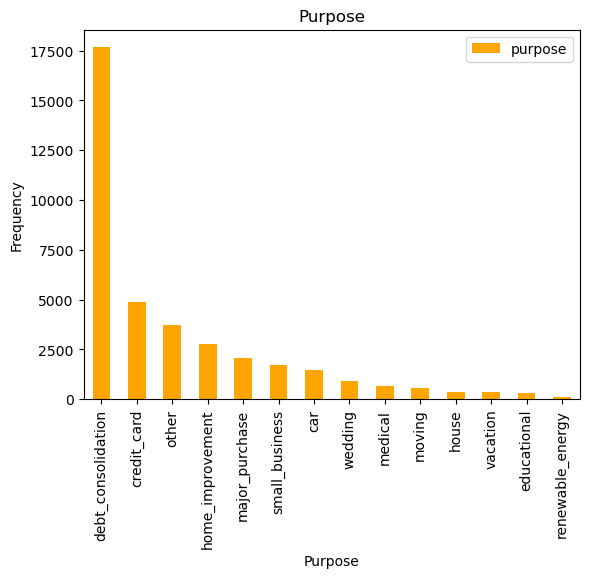

In [162]:
lc_df.purpose.value_counts().plot(kind = 'bar', color = 'orange')
plt.xlabel('Purpose')
plt.ylabel('Frequency')
plt.title('Purpose')
plt.xticks(rotation=90)
plt.legend(loc='upper right')

Observation : Maximum loan taken for Debt Consolidation purpose

### Quantitative Variables

# Loan Amount

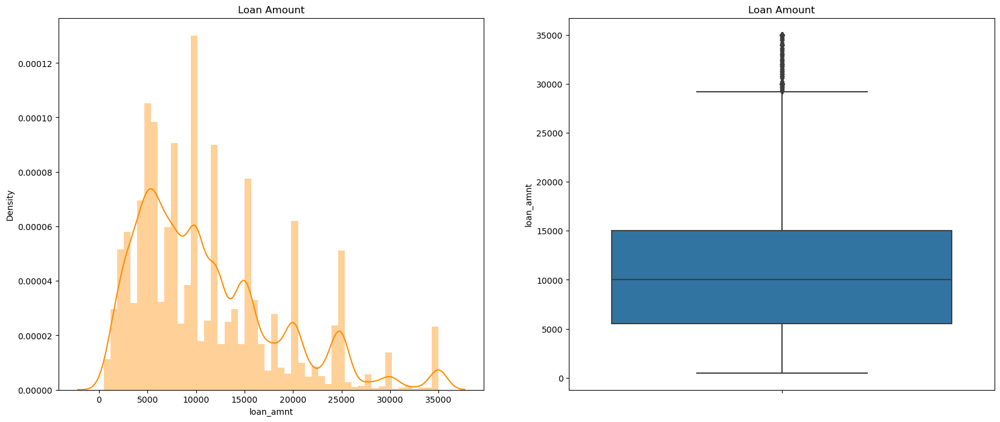

In [163]:
plt.figure(figsize=(20,8))
plt.subplot(121)
sns.distplot(lc_df.loan_amnt ,color = 'darkorange' )
plt.title('Loan Amount')
plt.subplot(122)
sns.boxplot(y=lc_df.loan_amnt)
plt.title('Loan Amount')
plt.show()

Observation : Maximum people took 10000 loan.

## Segmented Univariate Analayis

## Loan Amount

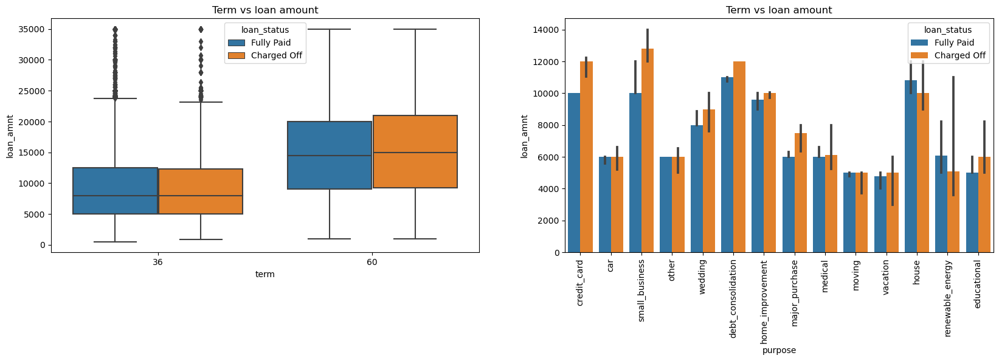

In [193]:
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.boxplot(x='term', y='loan_amnt', hue='loan_status', data=lc_df)
plt.title('Term vs loan amount')
plt.subplot(122)
sns.barplot(x='purpose', y='loan_amnt', hue='loan_status', data=lc_df, estimator=np.median)
plt.xticks(rotation=90)
plt.title('Purpose vs loan amount')
plt.show()

Observations:
Higher amount loans have high tenure i.e, 60 months and higher duration loans are more chargedoff as 
compare to shorter duration.
Small Bussiness have higher charges of charged off and house loan are maximum paid back fully


## Home Ownership VS Loan amount , Verification Status Vs Loan Amount 

<Axes: title={'center': 'verification_status vs Loan Amount'}, xlabel='verification_status', ylabel='loan_amnt'>

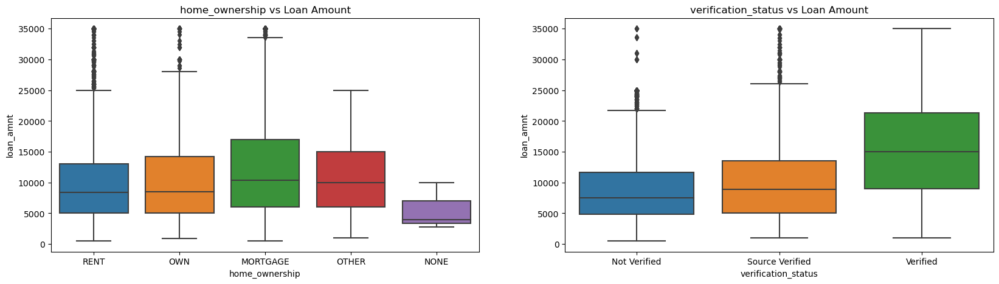

In [194]:
plt.figure(figsize=(20,5))
plt.subplot(121)
sns.boxplot(x='home_ownership', y=lc_df.loan_amnt, data=lc_df)
plt.title('home_ownership vs Loan Amount')
plt.subplot(122)
plt.title('verification_status vs Loan Amount')
verification_status_ord = lc_df.verification_status.unique()
verification_status_ord.sort()
sns.boxplot(x='verification_status', y=lc_df.loan_amnt, order = verification_status_ord, data=lc_df)

Observation : More borrowers are from MORTAGE and also the median loan amount also high for MORTAGE owned borrowers.
And most of borrowers are verified for borrowing loan >9000

## Purpose Vs Loan Amount

Text(0.5, 1.0, 'purpose vs Loan Amount')

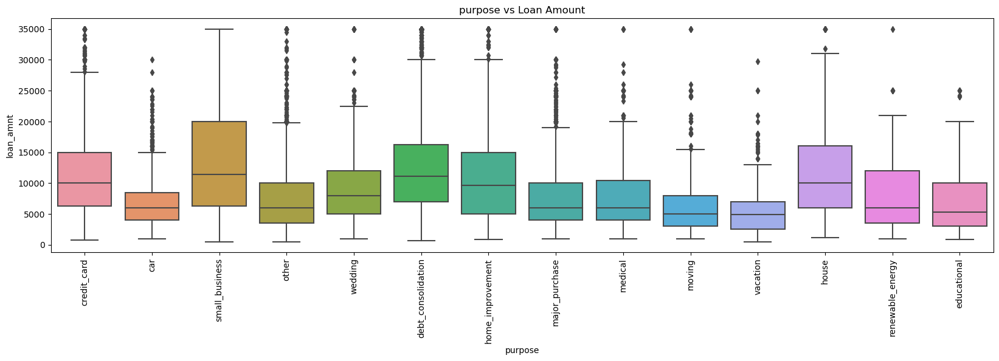

In [198]:
plt.figure(figsize=(20,5))
sns.boxplot(x='purpose', y=lc_df.loan_amnt, data=lc_df)
plt.xticks(rotation=90)
plt.title('purpose vs Loan Amount')

Observation : More loan amount is from Small bussiness followed by debt consolidation.

## Grade Vs Loan status

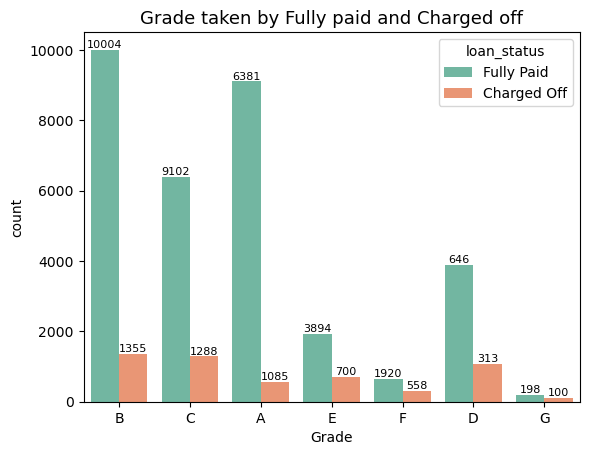

In [167]:
g1 = sns.countplot(x="grade",data=lc_df, 
              palette="Set2", 
              hue = "loan_status")
label_values = lc_fully_paid['grade'].value_counts()
g1.bar_label(container = g1.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['grade'].value_counts()
g1.bar_label(container = g1.containers[1], labels=label_values1, fontsize=8)

g1.set_title("Grade taken by Fully paid and Charged off", fontsize=13)
g1.set_xlabel("Grade")
plt.show()

In [ ]:
Observation : C is higher 

In [168]:
lc_df.groupby('loan_status')['grade'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,7,B,1355
Fully Paid,32145,7,B,10004


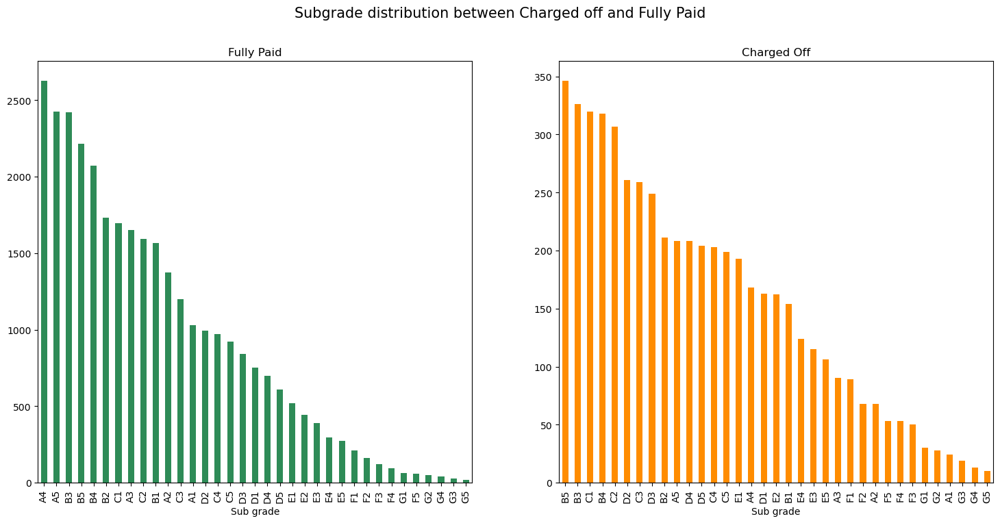

In [169]:
plt.figure(figsize=(18,8))

plt.subplot(1, 2, 1)
plt.xlabel('Sub grade')
plt.title('Fully Paid')
lc_fully_paid.sub_grade.value_counts().plot(kind='bar',color = "seagreen")


plt.subplot(1, 2, 2)
lc_charged_off.sub_grade.value_counts().plot(kind='bar',color = "darkorange")
plt.xlabel('Sub grade')
plt.title('Charged Off')

plt.suptitle("Subgrade distribution between Charged off and Fully Paid",fontsize=15)
plt.show()

In [170]:
lc_df.groupby('loan_status')['sub_grade'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,35,B5,346
Fully Paid,32145,35,A4,2624


## Employee Lenght Vs Loan Status

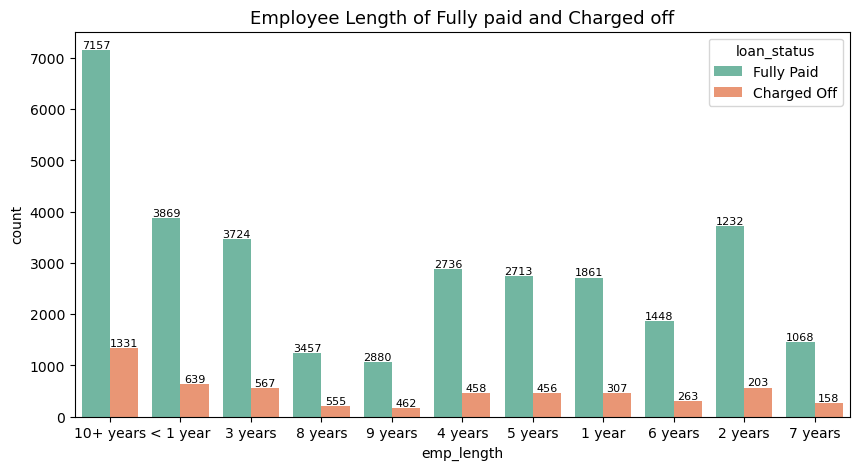

In [171]:
fig, ax = plt.subplots(figsize=(10,5))
g1 = sns.countplot(x="emp_length",data=lc_df, 
              palette="Set2", 
              hue = "loan_status")
label_values = lc_fully_paid['emp_length'].value_counts().values
g1.bar_label(container = g1.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['emp_length'].value_counts().values
g1.bar_label(container = g1.containers[1], labels=label_values1, fontsize=8)

g1.set_title("Employee Length of Fully paid and Charged off", fontsize=13)
g1.set_xlabel("emp_length")
plt.show()

In [172]:
lc_df.groupby("loan_status")['emp_length'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,11,10+ years,1331
Fully Paid,32145,11,10+ years,7157


## Home Ownership Vs Loan Status

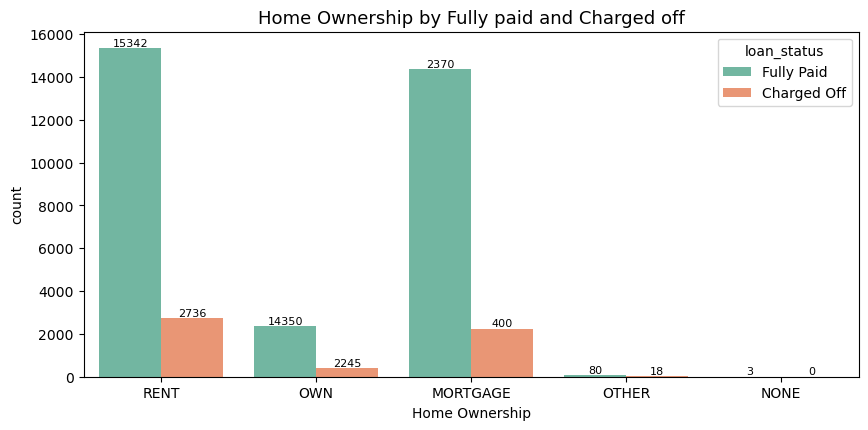

In [173]:
fig, ax = plt.subplots(figsize=(10,5))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g2 = sns.countplot(x="home_ownership",data=lc_df, 
              palette="Set2",
              hue = "loan_status")
label_values = lc_fully_paid['home_ownership'].value_counts().values
g2.bar_label(container = g2.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['home_ownership'].value_counts().values
g2.bar_label(container = g2.containers[1], labels=label_values1, fontsize=8)

g2.set_title("Home Ownership by Fully paid and Charged off", fontsize=13)
g2.set_xlabel("Home Ownership")
plt.show()

In [174]:
lc_df.groupby("loan_status")['home_ownership'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,4,RENT,2736
Fully Paid,32145,5,RENT,15342


### Categorical variable : verification_status

## Verification_status Vs Loan Status

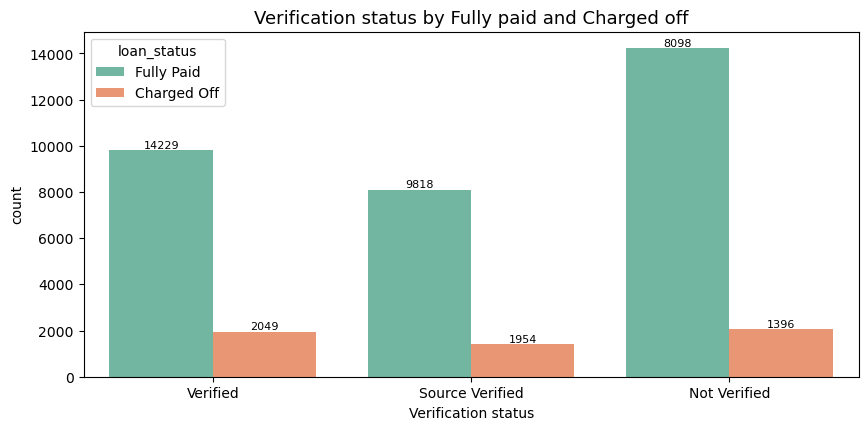

In [175]:
fig, ax = plt.subplots(figsize=(10,5))
plt.subplots_adjust(hspace = 0.4, top = 0.8)

g2 = sns.countplot(x="verification_status",data=lc_df, 
              palette="Set2",
              hue = "loan_status")
label_values = lc_fully_paid['verification_status'].value_counts().values
g2.bar_label(container = g2.containers[0], labels=label_values, fontsize=8)

label_values1 = lc_charged_off['verification_status'].value_counts().values
g2.bar_label(container = g2.containers[1], labels=label_values1, fontsize=8)

g2.set_title("Verification status by Fully paid and Charged off", fontsize=13)
g2.set_xlabel("Verification status")
plt.show()

In [176]:
lc_df.groupby("loan_status")['verification_status'].describe()

,count,unique,top,freq
loan_status,,,,
Charged Off,5399,3,Not Verified,2049
Fully Paid,32145,3,Not Verified,14229


### Conclusion:

#### Conclusion:

### Conclusion: Above are the categorical variables with it unique values

In [251]:
fig = px.box(lc_df, x="loan_status", y="loan_amnt",title="Loan amount between loan status")
fig.show()

In [181]:
lc_df.groupby('loan_status')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,5399.0,12244.077607,8086.515636,900.0,6000.0,10000.0,17000.0,35000.0
Fully Paid,32145.0,10930.419972,7206.743260,500.0,5400.0,9600.0,15000.0,35000.0


## Annual income vs Grade

## Term Vs Loan amount

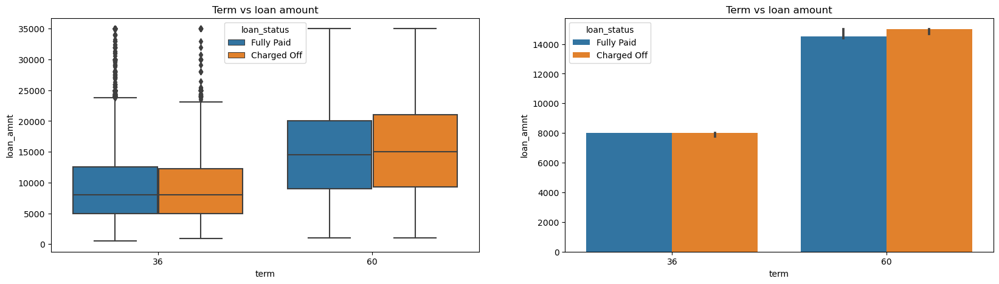

Higher amount loans have high tenure i.e, 60 months.
Grade 'G' and 'H' have taken max loan amount. As Grades are decreasing the loan amount is increasing.

### Bivariate Analysis

## Loan Amount vs Interest Rate

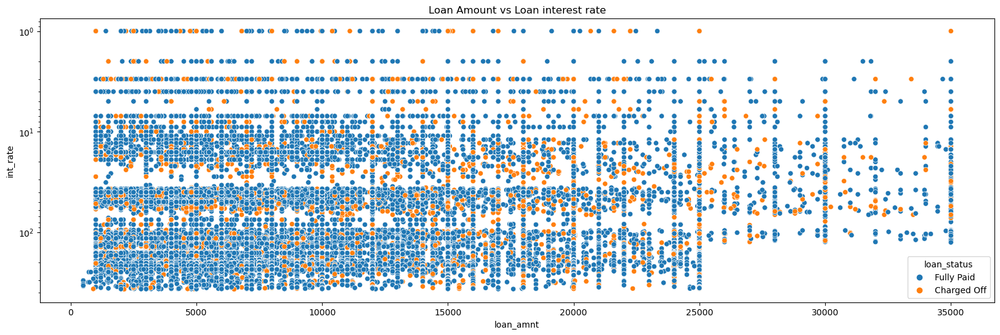

In [201]:
plt.figure(figsize=(20,6))
sns.scatterplot(x='loan_amnt', y='int_rate', data=lc_df, hue='loan_status')
plt.yscale('log')
plt.title('Loan Amount vs Loan interest rate')
plt.show()

## Loan Amount vs Annual income

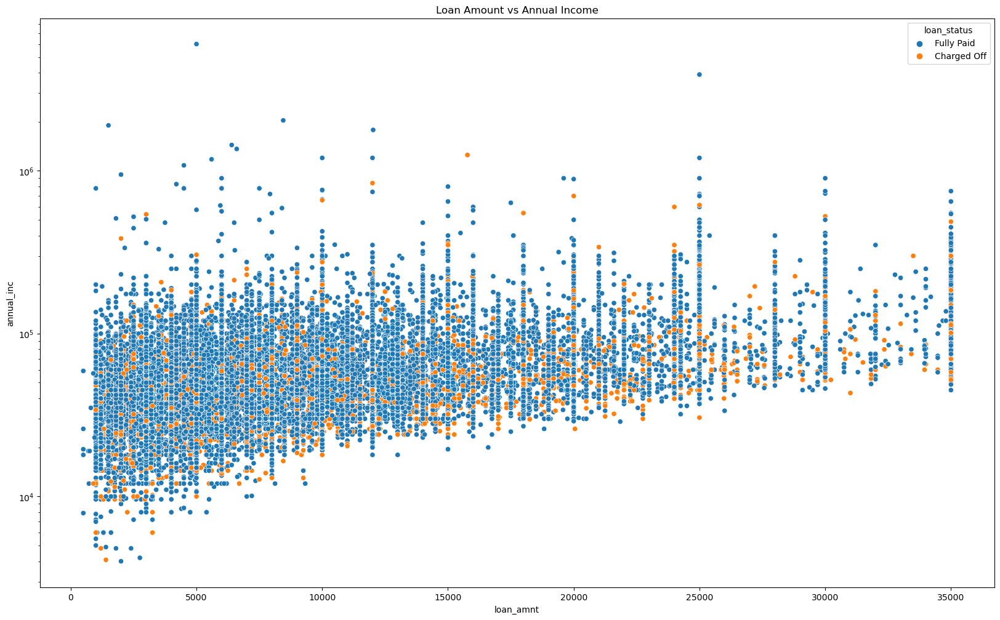

In [203]:
plt.figure(figsize=(20,12))
sns.scatterplot(x='loan_amnt', y='annual_inc', data=lc_df , hue = 'loan_status')
plt.yscale('log')
plt.title('Loan Amount vs Annual Income')
plt.show()

## Dervied Columns

In [238]:
lc_df["ratio_loan_funded"] = lc_df["funded_amnt_inv"] *100/lc_df["loan_amnt"]
lc_df

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,loan_status,pymnt_plan,purpose,dti,Borr_Agency,agency_Inves,issue_d_month,issue_d_year,Ratio_loan_funded,ratio_loan_funded
0,5000,5000,4975.0,36,10.65%,162.87,B,B2,NaN,10+ years,...,Fully Paid,n,credit_card,27.65,100.0,99.500000,12,2011,99.500000,99.500000
1,2500,2500,2500.0,60,15.27%,59.83,C,C4,Ryder,< 1 year,...,Charged Off,n,car,1.00,100.0,100.000000,12,2011,100.000000,100.000000
2,2400,2400,2400.0,36,15.96%,84.33,C,C5,NaN,10+ years,...,Fully Paid,n,small_business,8.72,100.0,100.000000,12,2011,100.000000,100.000000
3,10000,10000,10000.0,36,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,...,Fully Paid,n,other,20.00,100.0,100.000000,12,2011,100.000000,100.000000
5,5000,5000,5000.0,36,7.90%,156.46,A,A4,Veolia Transportaton,3 years,...,Fully Paid,n,wedding,11.20,100.0,100.000000,12,2011,100.000000,100.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,2500,1075.0,36,8.07%,78.42,A,A4,FiSite Research,4 years,...,Fully Paid,n,home_improvement,11.33,100.0,43.000000,7,2007,43.000000,43.000000
39713,8500,8500,875.0,36,10.28%,275.38,C,C1,"Squarewave Solutions, Ltd.",3 years,...,Fully Paid,n,credit_card,6.40,100.0,10.294118,7,2007,10.294118,10.294118
39714,5000,5000,1325.0,36,8.07%,156.84,A,A4,NaN,< 1 year,...,Fully Paid,n,debt_consolidation,2.30,100.0,26.500000,7,2007,26.500000,26.500000
39715,5000,5000,650.0,36,7.43%,155.38,A,A2,NaN,< 1 year,...,Fully Paid,n,other,3.72,100.0,13.000000,7,2007,13.000000,13.000000


### Derived Bivariant analysis

## Issue Year/Month Vs Funded Amount by Investor

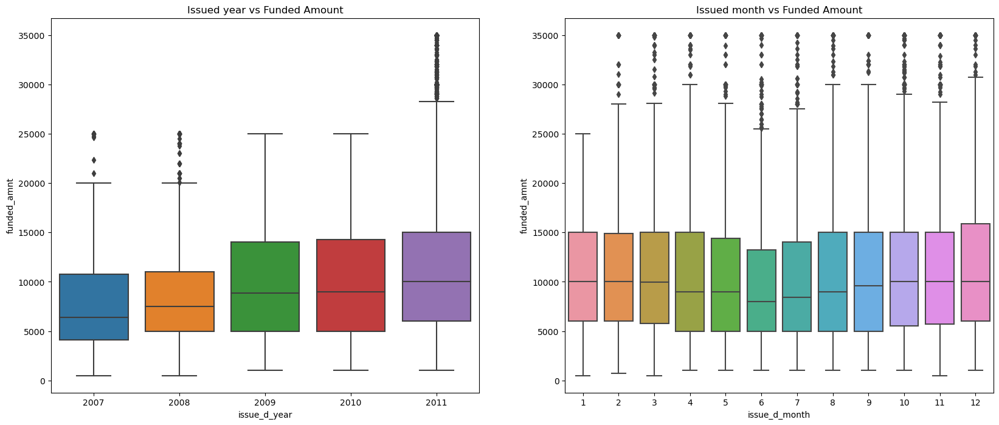

In [212]:
plt.figure(figsize=(20,8))
plt.subplot(121)
sns.boxplot(x=lc_df.issue_d_year, y=lc_df.funded_amnt, data=lc_df)
plt.title('Issued year vs Funded Amount')
plt.subplot(122)
sns.boxplot(x=lc_df.issue_d_month, y=lc_df.funded_amnt, data=lc_df)
plt.title('Issued month vs Funded Amount')
plt.show()

## Ratio loan amount vs Funded amount

In [225]:
lc_new = lc_df[lc_df["ratio_loan_funded"] <90]
lc_new.sort_values(by="ratio_loan_funded",ascending=False)
lc_new

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,loan_status,pymnt_plan,purpose,dti,Borr_Agency,agency_Inves,issue_d_month,issue_d_year,Ratio_loan_funded,ratio_loan_funded
26,15000,15000,8725.0,36,14.27%,514.64,C,C2,nyc transit,9 years,...,Charged Off,n,debt_consolidation,15.22,100.000000,58.166667,12,2011,58.166667,58.166667
61,17500,8950,8925.0,60,17.27%,223.74,D,D3,NaN,6 years,...,Fully Paid,n,small_business,19.47,51.142857,99.720670,12,2011,51.000000,51.000000
66,12500,8925,8925.0,60,17.27%,223.11,D,D3,grandma kitchen,5 years,...,Charged Off,n,debt_consolidation,13.16,71.400000,100.000000,12,2011,71.400000,71.400000
70,20975,13575,13550.0,60,17.58%,341.63,D,D4,Dollar Tree Stores,5 years,...,Fully Paid,n,credit_card,18.79,64.719905,99.815838,12,2011,64.600715,64.600715
80,35000,22075,22050.0,60,17.27%,551.84,D,D3,tutor Per ini Corporation,3 years,...,Fully Paid,n,home_improvement,7.51,63.071429,99.886750,12,2011,63.000000,63.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,2500,1075.0,36,8.07%,78.42,A,A4,FiSite Research,4 years,...,Fully Paid,n,home_improvement,11.33,100.000000,43.000000,7,2007,43.000000,43.000000
39713,8500,8500,875.0,36,10.28%,275.38,C,C1,"Squarewave Solutions, Ltd.",3 years,...,Fully Paid,n,credit_card,6.40,100.000000,10.294118,7,2007,10.294118,10.294118
39714,5000,5000,1325.0,36,8.07%,156.84,A,A4,NaN,< 1 year,...,Fully Paid,n,debt_consolidation,2.30,100.000000,26.500000,7,2007,26.500000,26.500000
39715,5000,5000,650.0,36,7.43%,155.38,A,A2,NaN,< 1 year,...,Fully Paid,n,other,3.72,100.000000,13.000000,7,2007,13.000000,13.000000


In [240]:
lc_new.shape

(4737, 24)

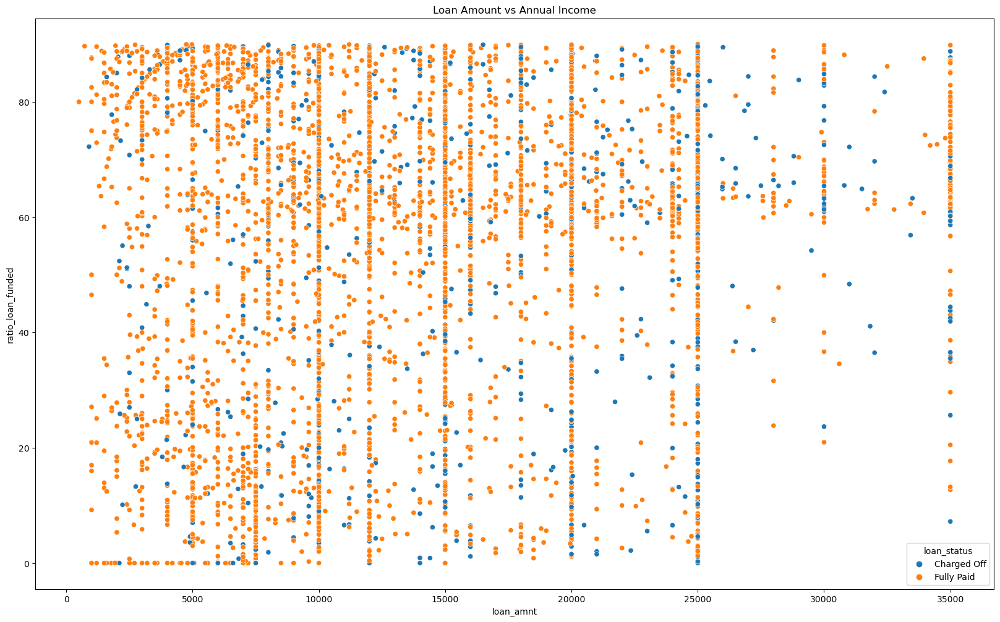

In [226]:
plt.figure(figsize=(20,12))
sns.scatterplot(x='loan_amnt', y='ratio_loan_funded', data=lc_new , hue = 'loan_status')
#plt.yscale('log')
plt.title('Loan Amount vs Annual Income')
plt.show()

If we considering less than 90 data of Ratio between loan amount and funded amount . Most of borrower are defaulted . 
Its risky for lending club to aprove loan of these customer.



### Observations
##### 1. 75% of applicants who have Fully paid loans requested 15000 and below.
##### 2. Charged off loans have higher average loan amount request compared to Fully paid loans. 
##### 3. 75% of Charged off applicants have requested for loan amount below 17000

In [253]:
fig = px.box(lc_df, x="loan_status", y="annual_inc",title="Annual income between loan status",)
fig.show()

In [257]:
fig = px.box(lc_df, x="loan_status", y="dti",title="Debt to income ratio between loan status",)
fig.show()

In [214]:
lc_corr= lc_df.corr()
lc_corr

,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,Borr_Agency,agency_Inves,issue_d_month,issue_d_year,Ratio_loan_funded,ratio_loan_funded
loan_amnt,1.000000,0.981603,0.936871,0.931686,0.266282,0.061402,-0.209495,-0.025076,0.052812,0.115074,-0.104984,-0.104984
funded_amnt,0.981603,1.000000,0.955300,0.957721,0.261959,0.061251,-0.033761,-0.015071,0.042576,0.126093,-0.034197,-0.034197
funded_amnt_inv,0.936871,0.955300,1.000000,0.904110,0.249320,0.070007,-0.020871,0.234367,0.069273,0.259073,0.198279,0.198279
installment,0.931686,0.957721,0.904110,1.000000,0.264684,0.050727,0.007684,-0.045588,0.029796,0.057550,-0.046200,-0.046200
annual_inc,0.266282,0.261959,0.249320,0.264684,1.000000,-0.123582,-0.050831,-0.010911,0.009557,0.012689,-0.028274,-0.028274
dti,0.061402,0.061251,0.070007,0.050727,-0.123582,1.000000,-0.010083,0.040822,0.012125,0.094332,0.033385,0.033385
Borr_Agency,-0.209495,-0.033761,-0.020871,0.007684,-0.050831,-0.010083,1.000000,0.120437,-0.071124,0.087072,0.442955,0.442955
agency_Inves,-0.025076,-0.015071,0.234367,-0.045588,-0.010911,0.040822,0.120437,1.000000,0.086467,0.586072,0.936197,0.936197
issue_d_month,0.052812,0.042576,0.069273,0.029796,0.009557,0.012125,-0.071124,0.086467,1.000000,-0.035307,0.052218,0.052218
issue_d_year,0.115074,0.126093,0.259073,0.057550,0.012689,0.094332,0.087072,0.586072,-0.035307,1.000000,0.556976,0.556976


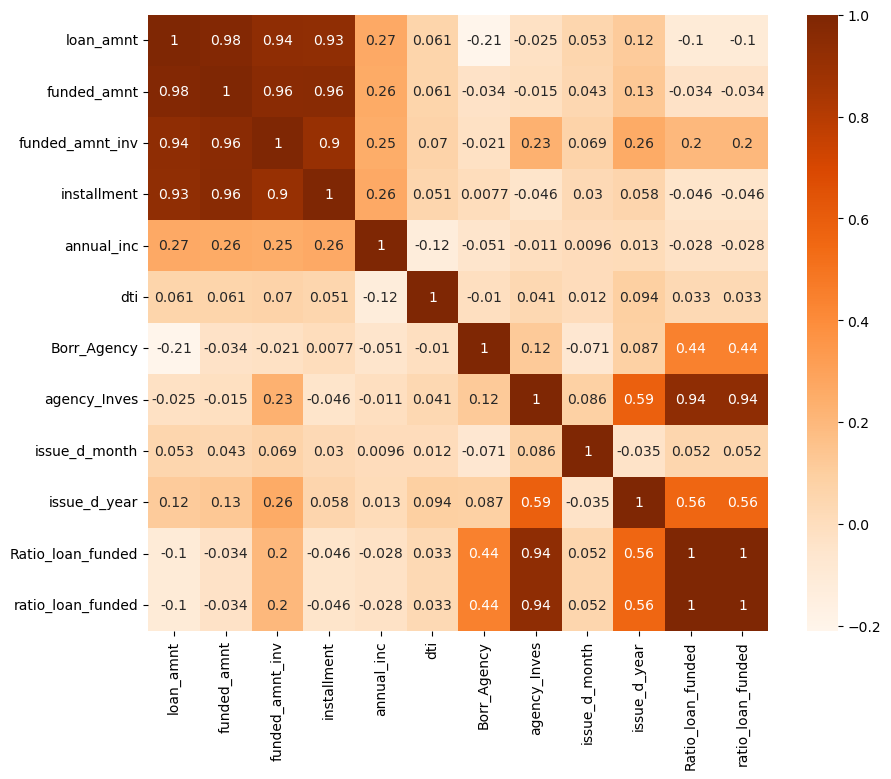

In [237]:
plt.figure(figsize =(10,8))
sns.heatmap(lc_corr , annot=True ,cmap = 'Oranges')
plt.show()

### Univariate and segmented univariate analysis is done correctly and appropriate realistic assumptions are made wherever required. The analyses successfully identify at least the 5 important driver variables (i.e. variables which are strong indicators of default).

#### Continuous variable are loan_amnt, funded_amnt_inv
#### Ordered categorical variable are term, grade, sub_grade